In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

#Importing Imbalanced Learn module
import imblearn

# Importing Feature Selection Models
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold

# Importing Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier


In [2]:
taiwan_bankruptcy = pd.read_csv("data.csv", skipinitialspace=True)

taiwan_bankruptcy.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [5]:
sum(taiwan_bankruptcy.isnull().sum() > 0)

0

In [3]:
taiwan_bankruptcy_b = taiwan_bankruptcy.drop(columns = ["Research and development expense rate","Total Asset Growth Rate",
                                                        'Total Asset Turnover',
                                                        'Accounts Receivable Turnover', 
                                                        'Inventory Turnover Rate (times)', 'Fixed Assets Turnover Frequency',
                                                        'Net Worth Turnover Rate (times)', "Current Asset Turnover Rate",
                                                        'Quick Asset Turnover Rate', 'Working capitcal Turnover Rate',
                                                        'Cash Turnover Rate'])

tb_df = taiwan_bankruptcy_b[(taiwan_bankruptcy_b <= 1.0 ).all(axis=1)]
tb_df.shape

(4170, 85)

In [4]:
tb_df.to_csv("filtered_data.csv")

In [8]:
tb_df.groupby('Bankrupt?').size()

Bankrupt?
0    4041
1     129
dtype: int64

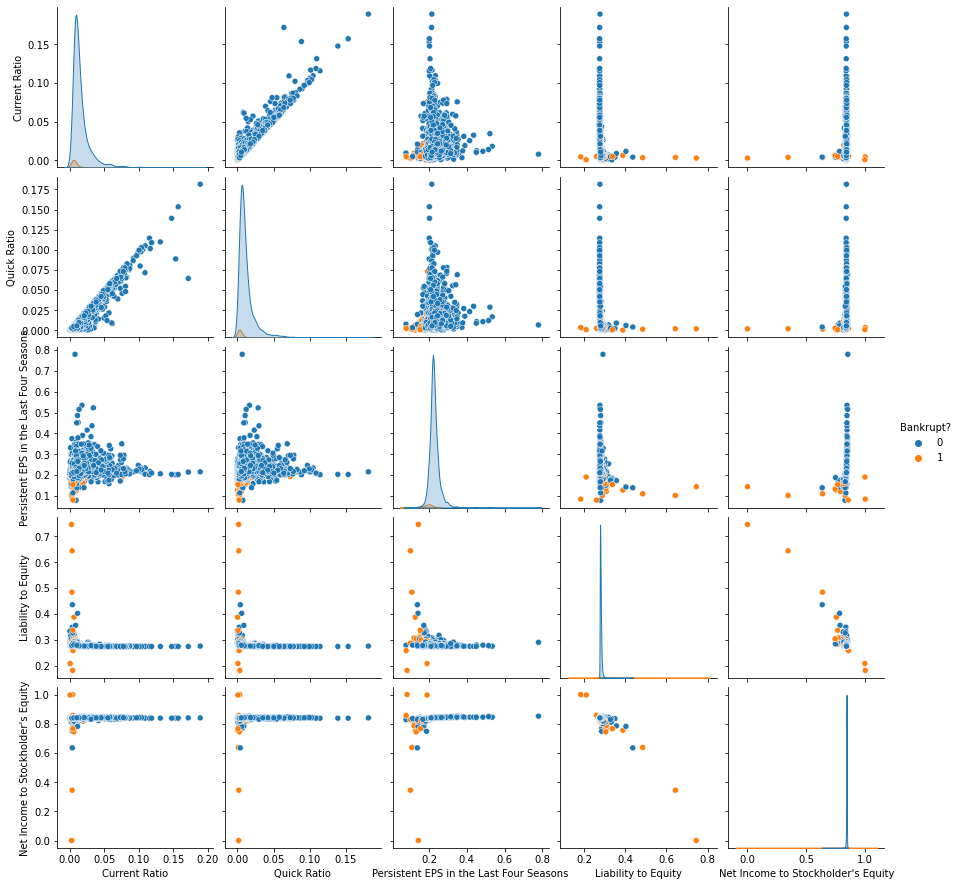

In [12]:
common_fr = ["Bankrupt?", "Current Ratio",
            "Quick Ratio", 
            "Persistent EPS in the Last Four Seasons", 
            "Liability to Equity",
            "Net Income to Stockholder's Equity"]
sns.pairplot( pd.DataFrame(tb_df[common_fr]) , hue = 'Bankrupt?', diag_kind="kde")

In [20]:
X = tb_df.drop(columns=["Bankrupt?"])
y = tb_df["Bankrupt?"]

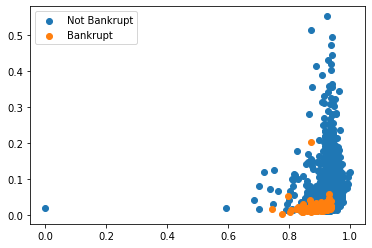

In [34]:
def example_plot(X,y):
    plt.scatter( X[y == 0]["Retained Earnings to Total Assets"], X[y == 0]["Equity to Liability"],label="Not Bankrupt")
    plt.scatter( X[y == 1]["Retained Earnings to Total Assets"], X[y == 1]["Equity to Liability"], label="Bankrupt")
    plt.legend()
    plt.show()
example_plot(X,y)

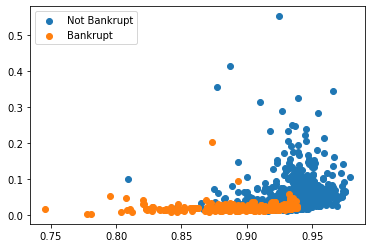

In [41]:
#Oversample minority so that % of minority equals specified val
min_perc = 0.1
over = imblearn.over_sampling.SMOTE(sampling_strategy= min_perc)

#Undersample majority so that majority exceeds minority by specified val
maj_perc = 0.5
under = imblearn.under_sampling.RandomUnderSampler(sampling_strategy=maj_perc)

# Over + Under Pipeline
steps = [('o', over), ('u', under)]
smote_pipeline = imblearn.pipeline.Pipeline(steps = steps)
X_transform, y_transform = smote_pipeline.fit_resample(X, y)

#Plot Transformed Sample
example_plot(X_transform, y_transform)

In [43]:
print("Original Sample: ", Counter(y))
print("Transformed Sample: ", Counter(y_transform))

Original Sample:  Counter({0: 4041, 1: 129})
Transformed Sample:  Counter({0: 808, 1: 404})


In [114]:
test_size = 0.2
random_state = 0

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state= random_state, stratify = y)

max_depth = 10

models = []

logit_reg = LogisticRegression(solver='liblinear', multi_class='ovr')
models.append(('LR', logit_reg))

lda =  LinearDiscriminantAnalysis()
models.append(('LDA', lda))

nb = GaussianNB()
models.append(('NB', nb))

knn = KNeighborsClassifier()
models.append(('KNN', knn))

dec_tree =  DecisionTreeClassifier()
models.append(('CART', dec_tree))

rfc = RandomForestClassifier(max_depth= max_depth, random_state = random_state)
models.append(('RF', rfc))

names = []
mean_results = []
std_results = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state= 1, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    names.append(name)
    mean_results.append(cv_results.mean())
    std_results.append(cv_results.std())


In [115]:
pd.DataFrame(data = {"Method": names, "Mean Accuracy": mean_results, "Stdev. Accuracy": std_results})

,Method,Mean Accuracy,Stdev. Accuracy
0,LR,0.969790,0.003015
1,LDA,0.964510,0.008617
2,NB,0.810094,0.026042
3,KNN,0.968347,0.002321
4,CART,0.952521,0.009457
5,RF,0.970268,0.004673


In [108]:
# Practice Feature Selection 
k = 10
estimator = logit_reg

# Supervised Methods

#Univariate 
SKB_selector = SelectKBest(chi2, k=k).fit(X_train, y_train)

# Model Based
RFECV_selector = RFECV(estimator , step=1, cv=5,min_features_to_select = k).fit(X_train, y_train)

clf = ExtraTreesClassifier(n_estimators=50)
clf.fit(X_train, y_train)
tree_selector = SelectFromModel(clf, prefit=True, max_features=k)

selectors = [SKB_selector, RFECV_selector, tree_selector]

In [109]:
for selector in selectors:
    cols = X_train[X_train.columns[selector.get_support(indices=True)]].columns
    print(cols)

Index(['ROA(A) before interest and % after tax',
       'ROA(B) before interest and depreciation after tax', 'Tax rate (A)',
       'Total debt/Total net worth', 'Debt ratio %',
       'Quick Assets/Total Assets', 'Cash/Total Assets',
       'Current Liability to Assets', 'Current Liability to Current Assets',
       'Equity to Liability'],
      dtype='object')
Index(['ROA(C) before interest and depreciation before interest',
       'ROA(A) before interest and % after tax',
       'ROA(B) before interest and depreciation after tax', 'Tax rate (A)',
       'Persistent EPS in the Last Four Seasons',
       'Per Share Net profit before tax (Yuan ¥)', 'Debt ratio %',
       'Net worth/Assets', 'Borrowing dependency',
       'Net profit before tax/Paid-in capital', 'Cash/Total Assets',
       'Current Liability to Assets', 'Fixed Assets to Assets',
       'Net Income to Total Assets', 'Net Income Flag'],
      dtype='object')
Index(['Interest-bearing debt interest rate',
       'Persistent